In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
import numpy as np

# Tema 4: Modelos de árboles y ensemble learning

Los ejemplos y la discusión que sigue está tomada del libro:

[*Introduction to Machine Learning with Python*](http://shop.oreilly.com/product/0636920030515.do)  
**Andreas C. Müller & Sarah Guido**  
O'Reilly 2017

Github con el material del libro: [Github](https://github.com/amueller/introduction_to_ml_with_python). 

El libro está accesible *online* desde la [Biblioteca de la Universidad de Sevilla](https://fama.us.es), como recurso electrónico.

Antes que nada, cargamos el módulo `mglearn` (recordar que para que funcione la carga, debemos poner la carpeta `mglearn` en cualquiera de las carpetas que usa python para cargar sus módulos).

In [2]:
import mglearn

#### GraphViz
- Necesario para las visualizaciones del notebook.
- Sistema https://graphviz.org/download/
- Módulo `graphviz` de Python

In [3]:
# !pip install graphviz

## Árboles de decisión

Un arbol de dedicisión es una representación de conocimiento en forma de arbol, en el que las hojas con la respuesta o decisión a tomar y el camino hacia las mismas nos dan una descripción de una situación o individuo concreto.

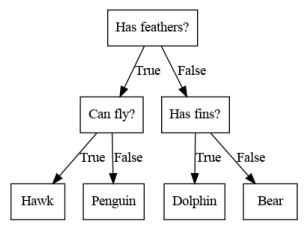

In [4]:
mglearn.plots.plot_animal_tree()

Una de las grandes ventajas de los árboles de decisión es su **interpretabilidad**.

#### CART
- **CART** es el algoritmo de aprendizaje de árboles de decisión implementado por scikit-learn. 
- Podemos usarlo tanto para clasificación como para regresión:
    - DecisionTreeClassifier
    - DecisionTreeRegressor

- Este algoritmo trabaja sobre variables numéricas y realiza un corte binario en cada nodo.
- Veamos paso a paso el proceso de construcción del arbol. Cada *split* dividirá en dos una región del espacio de clasificación.

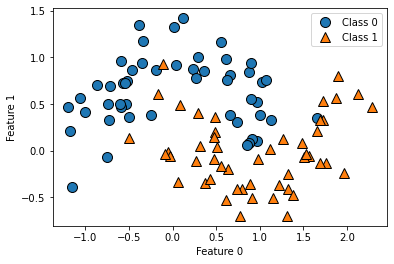

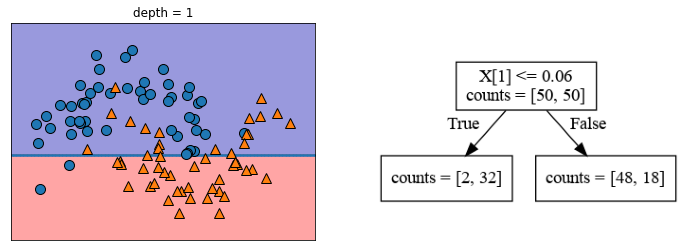

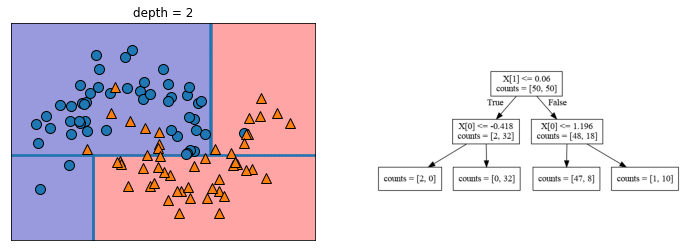

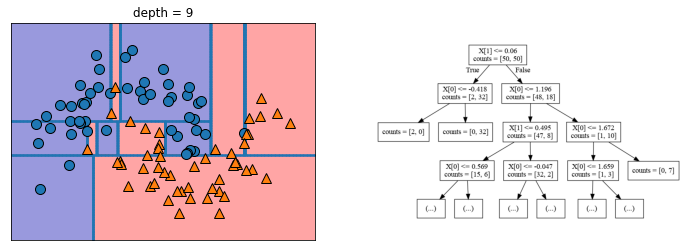

In [5]:
mglearn.plots.plot_tree_progressive()

##### El problema del sobreajuste

- El algoritmo seguirá añadiendo nuevos nodos hasta que cada hoja sea pura, es decir, hasta que todas las instancias representadas por cada hoja sean de la misma clase.
- El riesgo de sobreajuste que esto implica es elevado.
- En la imagen anterior podemos ver pequeñas regiones de color salmon intercaladas en zonas que son mayoritariamente azules. 

#### Reduciendo la complejidad del modelo

- Scikit-learn no proporciona métodos de post-poda
- Pre-poda: podemos controlar la complejidad del modelo añadiendo criterios de parada para limitar así el crecimiento del árbol.
- Veamos los diferentes paŕametros con los que podemos configurar el algoritmo:

In [6]:
from sklearn.tree import DecisionTreeClassifier

DecisionTreeClassifier(random_state=0)

DecisionTreeClassifier(random_state=0)

Los parámetros más importantes para controlar la complejidad del modelo son los siguientes:
- max_depth
- max_leaf_nodes
- min_samples_leaf

Veamos un ejemplo de sobreajuste en árboles decisión, para esto usaremos el conjunto de datos sobre cáncer de mama.

In [7]:
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

cancer = load_breast_cancer()
X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, cancer.target, stratify=cancer.target, random_state=42)
tree = DecisionTreeClassifier(random_state=0)
tree.fit(X_train, y_train)
print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.937


- Hemos obtenido una clasificación perfecta en el conjunto de entrenamiento.
- Veamos ahora que ocurre si limitamos la profundidad del árbol.

In [8]:
tree = DecisionTreeClassifier(max_depth=4, random_state=0)
tree.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.951


- Hemos obtenido peor clasificación en el conjunto de entrenamiento. Sin embargo, hemos mejorado la puntuación en el conjunto de evaluación.
- Nuestro primer modelo estaba sobreajustado sobre el conjunto de entrenamiento.

Veamos como evoluciona el error sobre el conjunto de evaluación para diferentes profundidades:

In [9]:
for i in range(1, 20):
    tree = DecisionTreeClassifier(max_depth=i, random_state=0)
    tree.fit(X_train, y_train)

    print("Depth: {}. Accuracy on training set: {:.3f}".format(i, tree.score(X_train, y_train)))
    print("Depth: {}. Accuracy on test set: {:.3f}".format(i, tree.score(X_test, y_test)))

Depth: 1. Accuracy on training set: 0.923
Depth: 1. Accuracy on test set: 0.923
Depth: 2. Accuracy on training set: 0.958
Depth: 2. Accuracy on test set: 0.909
Depth: 3. Accuracy on training set: 0.977
Depth: 3. Accuracy on test set: 0.944
Depth: 4. Accuracy on training set: 0.988
Depth: 4. Accuracy on test set: 0.951
Depth: 5. Accuracy on training set: 0.995
Depth: 5. Accuracy on test set: 0.951
Depth: 6. Accuracy on training set: 0.998
Depth: 6. Accuracy on test set: 0.937
Depth: 7. Accuracy on training set: 1.000
Depth: 7. Accuracy on test set: 0.937
Depth: 8. Accuracy on training set: 1.000
Depth: 8. Accuracy on test set: 0.937
Depth: 9. Accuracy on training set: 1.000
Depth: 9. Accuracy on test set: 0.937
Depth: 10. Accuracy on training set: 1.000
Depth: 10. Accuracy on test set: 0.937
Depth: 11. Accuracy on training set: 1.000
Depth: 11. Accuracy on test set: 0.937
Depth: 12. Accuracy on training set: 1.000
Depth: 12. Accuracy on test set: 0.937
Depth: 13. Accuracy on training se

#### Explorando el árbol de decisión
- Recordemos que una de las grandes ventajas de los árboles de decisión es que son intuitivos y no se requieren conomientos técnicos para entenderlos.
- Graphviz son un conjunto de herramientas y librerías auxiliares de código libre usadas por gran cantidad de sistemas para la representación gráfica de todo tipo de diagramas (grafos, árboles, etc.).

In [10]:
from sklearn.tree import export_graphviz
export_graphviz(tree, out_file="tree.dot", class_names=["malignant", "benign"],
                feature_names=cancer.feature_names, impurity=True, filled=True)

- Veamos como ha quedado nuestro arbol de profundidad 4.

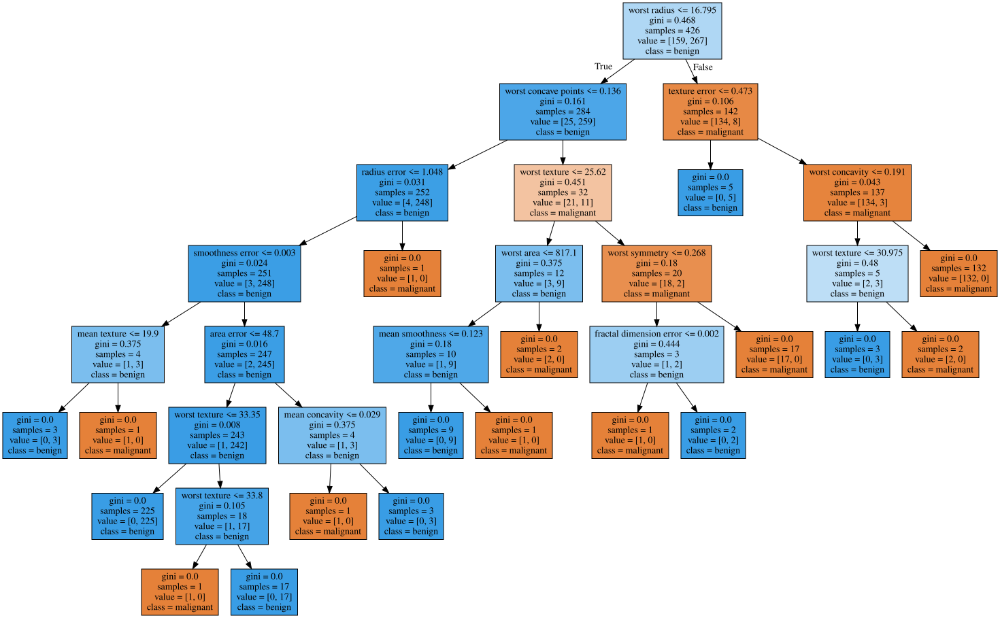

In [11]:
import graphviz

with open("tree.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

- Con árboles mayores, al gráfico puede ser más dificil de explorar. Sin embargo, nos proporciona información adicional de gran utilidad.
- En nuestro caso, vemos que solo con el primer corte es posible explicar la mayor parte del problema.
- Veamos como quedaría un árbol de profundidad 1.

In [12]:
tree = DecisionTreeClassifier(max_depth=1, random_state=0)
tree.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(tree.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(tree.score(X_test, y_test)))

Accuracy on training set: 0.923
Accuracy on test set: 0.923


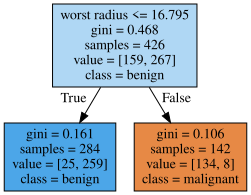

In [13]:
export_graphviz(tree, out_file="tree.dot", class_names=["malignant", "benign"],
                feature_names=cancer.feature_names, impurity=True, filled=True)
with open("tree.dot") as f:
    dot_graph = f.read()
display(graphviz.Source(dot_graph))

#### Análisis de los criterios de separación

Veamos ahora con más detalle cómo se buscan los mejores criterios de separación en el algoritmo CART. Estos criterios de separación consisten en comparar el valor de una característica con una cota, separando las muestras que tienen un valor menor o igual que la cota de aquellas que tienen un valor mayor que la cota. El funcionamiento del criterio es simple, al igual que la forma de calcular el mejor de todos: el que tiene un valor más bajo de la suma ponderada de los grados de impureza. Veamos a continuación como se escogen las cotas con respecto a las cuales se definen estos criterios.

Fijémonos en una característica en concreto, por ejemplo *'worst radius'*. Primero debemos considerar todas las muestras asociadas al nodo en el que estamos buscando el criterio de separación, fijándonos en el valor de esta característica junto con su valor de clasificación.

- Primero obtenemos el índice de la característica que queremos explorar.

In [14]:
np.where(cancer.feature_names == 'worst radius')

(array([20]),)

In [15]:
cancer.feature_names[20]

'worst radius'

In [16]:
worst_radius_index = 20

- Obtenemos una lista de pares (worst radius, valor de la variable respuesta).

In [17]:
n_samples = y_train.shape[0]
Xy_pair = [(X_train[i, worst_radius_index], y_train[i]) for i in range(n_samples)]
Xy_pair

[(23.73, 0),
 (13.62, 1),
 (22.25, 0),
 (19.85, 0),
 (27.66, 0),
 (19.18, 0),
 (13.15, 1),
 (25.38, 0),
 (23.32, 0),
 (9.968, 1),
 (16.76, 1),
 (15.53, 0),
 (18.55, 0),
 (16.86, 0),
 (15.44, 1),
 (20.27, 0),
 (15.8, 1),
 (9.414, 1),
 (15.34, 1),
 (13.35, 1),
 (15.93, 0),
 (16.3, 1),
 (9.262, 1),
 (13.64, 1),
 (10.67, 1),
 (14.45, 1),
 (16.25, 1),
 (10.01, 1),
 (22.03, 0),
 (15.63, 1),
 (15.2, 0),
 (32.49, 0),
 (18.49, 0),
 (16.77, 1),
 (13.74, 1),
 (13.35, 1),
 (14.41, 1),
 (11.92, 1),
 (13.33, 1),
 (12.36, 1),
 (20.47, 0),
 (12.13, 1),
 (13.72, 1),
 (14.37, 1),
 (15.61, 1),
 (13.75, 1),
 (16.46, 1),
 (14.1, 1),
 (13.36, 1),
 (9.077, 1),
 (13.13, 1),
 (19.76, 0),
 (15.47, 0),
 (29.92, 0),
 (14.54, 1),
 (21.58, 0),
 (14.34, 1),
 (14.69, 1),
 (20.8, 0),
 (18.07, 0),
 (11.06, 1),
 (16.41, 1),
 (10.6, 1),
 (20.38, 0),
 (13.19, 1),
 (20.39, 0),
 (15.15, 1),
 (17.18, 1),
 (18.07, 0),
 (24.29, 0),
 (12.68, 1),
 (30.0, 0),
 (22.63, 0),
 (14.92, 1),
 (16.11, 1),
 (14.91, 1),
 (14.17, 1),
 (10.6

- A continuación ordenamos estas muestras con respecto al valor de la característica. Para ello es suficiente con ordenar la lista de parejas anterior con la función `sorted`.

In [18]:
Xy_sorted = sorted(Xy_pair)
Xy_sorted

[(7.93, 1),
 (8.678, 1),
 (8.952, 1),
 (8.964, 1),
 (9.077, 1),
 (9.092, 1),
 (9.262, 1),
 (9.414, 1),
 (9.473, 1),
 (9.507, 1),
 (9.565, 1),
 (9.628, 1),
 (9.733, 1),
 (9.968, 1),
 (10.01, 1),
 (10.06, 1),
 (10.17, 1),
 (10.23, 1),
 (10.31, 1),
 (10.41, 1),
 (10.49, 1),
 (10.51, 1),
 (10.57, 1),
 (10.6, 1),
 (10.65, 1),
 (10.67, 1),
 (10.75, 1),
 (10.75, 1),
 (10.83, 1),
 (10.84, 1),
 (10.85, 1),
 (10.85, 1),
 (10.88, 1),
 (10.92, 1),
 (10.93, 1),
 (10.94, 1),
 (11.02, 1),
 (11.02, 1),
 (11.05, 1),
 (11.06, 1),
 (11.11, 1),
 (11.14, 1),
 (11.16, 1),
 (11.16, 1),
 (11.17, 1),
 (11.21, 1),
 (11.24, 1),
 (11.25, 1),
 (11.26, 1),
 (11.28, 1),
 (11.35, 1),
 (11.38, 1),
 (11.48, 1),
 (11.52, 1),
 (11.54, 1),
 (11.6, 1),
 (11.66, 1),
 (11.87, 1),
 (11.92, 1),
 (11.92, 1),
 (11.92, 1),
 (11.93, 1),
 (11.94, 1),
 (11.95, 1),
 (11.98, 1),
 (11.99, 1),
 (12.02, 1),
 (12.04, 1),
 (12.09, 1),
 (12.13, 1),
 (12.2, 1),
 (12.25, 1),
 (12.32, 1),
 (12.32, 1),
 (12.33, 1),
 (12.34, 1),
 (12.36, 1),
 (1

- Ahora buscamos los valores de la característica entre los que el valor de clasificación cambia. Una forma de hacer esto consiste en emparejar cada dato con el siguiente y considerar aquellas parejas en las que el valor de clasificación cambia. Para cada pareja encontrada nos interesa el valor medio entre los valores de la característica.

In [19]:
cotas = []
for ((vi,ci),(vj,cj)) in zip(Xy_sorted,(Xy_sorted[1:])):
    if ci != cj:
        cotas.extend([(vj+vi)/2])      
cotas

[13.219999999999999,
 13.24,
 13.355,
 13.36,
 13.73,
 13.74,
 14.485,
 14.495000000000001,
 14.879999999999999,
 14.91,
 14.985,
 15.0,
 15.07,
 15.094999999999999,
 15.175,
 15.235,
 15.28,
 15.295,
 15.455,
 15.475000000000001,
 15.52,
 15.53,
 15.64,
 15.655000000000001,
 15.665,
 15.75,
 15.870000000000001,
 15.955,
 16.215,
 16.240000000000002,
 16.305,
 16.335,
 16.345,
 16.355,
 16.375,
 16.41,
 16.42,
 16.439999999999998,
 16.795,
 17.0,
 17.025,
 17.145,
 17.22,
 17.265,
 17.29,
 17.314999999999998,
 17.34,
 17.38,
 17.384999999999998,
 17.48,
 17.509999999999998,
 18.16,
 18.225,
 19.810000000000002,
 19.835]

- Ahora montamos todo como una función.

In [20]:
def get_levels_for_feature(X_data, y_data, feature_name):
    feature_index = np.where(cancer.feature_names == feature_name)[0][0]
    n_samples = y_data.shape[0]
    Xy_pair = sorted([(X_data[i, feature_index], y_data[i]) for i in range(n_samples)])
    levels = []
    for ((vi,ci),(vj,cj)) in zip(Xy_pair,(Xy_pair[1:])):
        if ci != cj:
            levels.extend([(vj+vi)/2])
    return levels 

In [21]:
get_levels_for_feature(X_train, y_train, 'worst radius')

[13.219999999999999,
 13.24,
 13.355,
 13.36,
 13.73,
 13.74,
 14.485,
 14.495000000000001,
 14.879999999999999,
 14.91,
 14.985,
 15.0,
 15.07,
 15.094999999999999,
 15.175,
 15.235,
 15.28,
 15.295,
 15.455,
 15.475000000000001,
 15.52,
 15.53,
 15.64,
 15.655000000000001,
 15.665,
 15.75,
 15.870000000000001,
 15.955,
 16.215,
 16.240000000000002,
 16.305,
 16.335,
 16.345,
 16.355,
 16.375,
 16.41,
 16.42,
 16.439999999999998,
 16.795,
 17.0,
 17.025,
 17.145,
 17.22,
 17.265,
 17.29,
 17.314999999999998,
 17.34,
 17.38,
 17.384999999999998,
 17.48,
 17.509999999999998,
 18.16,
 18.225,
 19.810000000000002,
 19.835]

In [22]:
get_levels_for_feature(X_train, y_train, 'texture error')

[0.47315,
 0.4779,
 0.49155,
 0.4961,
 0.5489999999999999,
 0.55835,
 0.56715,
 0.5706,
 0.5889,
 0.61235,
 0.6332500000000001,
 0.6376999999999999,
 0.6556500000000001,
 0.6588499999999999,
 0.66225,
 0.6646,
 0.67675,
 0.67915,
 0.6825,
 0.6894,
 0.6965,
 0.71235,
 0.7377499999999999,
 0.73885,
 0.7423,
 0.7525,
 0.7622,
 0.7642,
 0.7722,
 0.7766500000000001,
 0.7793,
 0.7805,
 0.78115,
 0.7814,
 0.7837000000000001,
 0.7871,
 0.80855,
 0.8109500000000001,
 0.81855,
 0.8225,
 0.8237,
 0.82835,
 0.8324,
 0.8347,
 0.8384,
 0.8418000000000001,
 0.8469,
 0.85155,
 0.8538,
 0.8561,
 0.8564499999999999,
 0.861,
 0.8734500000000001,
 0.8741000000000001,
 0.8747,
 0.8792500000000001,
 0.8869,
 0.89045,
 0.8922000000000001,
 0.89405,
 0.8974,
 0.90155,
 0.9039999999999999,
 0.90655,
 0.91415,
 0.9184,
 0.9196,
 0.9216,
 0.9232499999999999,
 0.92545,
 0.9285,
 0.93675,
 0.9459,
 0.9497,
 0.9530000000000001,
 0.9550000000000001,
 0.9613,
 0.9657,
 0.9715,
 0.9763999999999999,
 0.98275,
 0.98575,

- Una vez se tienen los posibles valores de las cotas, basta con averiguar cual es la que disminuye en mayor medida el grado de impureza. Por ejemplo, para la primera cota candidata, se calcula la distribución de las muestras que tienen un valor de  la característica menor o igual que la cota (`dist_left`) y la distribución de las muestras que tienen un valor de la característica mayor que la cota (`dist_right`).

In [23]:
def class_distribution_by_branch(threshold):
    dist_left = [len([1 for j in range(n_samples) 
                        if X_train[j][worst_radius_index] <= threshold
                        and y_train[j] == i]) for i in range(2)] 

    dist_right = [len([1 for j in range(n_samples) 
                         if X_train[j][worst_radius_index] > threshold
                         and y_train[j] == i]) for i in range(2)]
    print("Distribución rama izquierda: ",dist_left)
    print("Distribución rama derecha: ",dist_right)
    return dist_left, dist_right

In [24]:
class_distribution_by_branch(13.22)

Distribución rama izquierda:  [0, 120]
Distribución rama derecha:  [159, 147]


([0, 120], [159, 147])

- Veamos una cota candidata superior:

In [25]:
class_distribution_by_branch(15.28)

Distribución rama izquierda:  [8, 221]
Distribución rama derecha:  [151, 46]


([8, 221], [151, 46])

- Finalmente hay que calcular la mejora en el grado de dispersión para cada criterio de separación. El índice de Gini de una distribución de datos se puede calcular con la siguiente función:


In [26]:
def gini(xs):
    n = sum(xs)
    ps = [x/n if n > 0 else 0 for x in xs]
    return 1-sum(p**2 for p in ps)

El grado de dispersión ponderado después de usar el criterio de separación es:

$$\sum^r_{i=1} \frac{|{\cal S}_i|}{|{\cal S}|} G({\cal S}_i)$$

La siguiente función calcula el grado de dispersión (índice de Gini) de un criterio de separación a partir de una muestra de datos, sus valores de clasificación, la característica considerada en el criterio y la cota con respecto a la que se compara el valor de esta característica. 

In [27]:
def indice_gini(X_data, y_data, caracteristica, cota):
    n = y_data.shape[0]
    dist_left = [len([1 for j in range(n) 
                        if X_data[j][caracteristica] <= cota
                        and y_data[j] == i]) for i in range(2)]    
    dist_right = [len([1 for j in range(n) 
                         if X_data[j][caracteristica] > cota
                         and y_data[j] == i]) for i in range(2)]
    return (sum(dist_left)*gini(dist_left)+sum(dist_right)*gini(dist_right))/n

- Veamos como queda el índice de gini para la lista de cotas de la característica *worst radius*.

In [28]:
cotas_gini = [(c,indice_gini(X_train, y_train, worst_radius_index, c)) for c in cotas]
cotas_gini

[(13.219999999999999, 0.3586025959679646),
 (13.24, 0.3609078977749152),
 (13.355, 0.3422999457189383),
 (13.36, 0.3445268025220567),
 (13.73, 0.31294127092662205),
 (13.74, 0.315071066266343),
 (14.485, 0.24515353685109062),
 (14.495000000000001, 0.24921405438809108),
 (14.879999999999999, 0.2215022749746578),
 (14.91, 0.22319204743326948),
 (14.985, 0.21573204660059123),
 (15.0, 0.21985594691780871),
 (15.07, 0.21220864463035938),
 (15.094999999999999, 0.21631850478214174),
 (15.175, 0.2003926688103294),
 (15.235, 0.20451987131008623),
 (15.28, 0.20178125477088368),
 (15.295, 0.20587750103103097),
 (15.455, 0.18596529953278038),
 (15.475000000000001, 0.19009110986318403),
 (15.52, 0.1780712120368636),
 (15.53, 0.17911948361036328),
 (15.64, 0.1728602872883189),
 (15.655000000000001, 0.17697809228883354),
 (15.665, 0.17380506307143323),
 (15.75, 0.182792155230232),
 (15.870000000000001, 0.16969306648715823),
 (15.955, 0.17772786590343087),
 (16.215, 0.1640644462567623),
 (16.240000000

- Veamos cual es el mejor corte para la característica *worst radius*. Coincide con el que ha usado el algoritmo.

In [29]:
min(cotas_gini, key = lambda t: t[1])

(16.795, 0.1424816504661773)

- Para generar una nueva ramificación en CART, calcularíamos el mejor corte entre todas las características.

In [30]:
mejores_cotas = []
for i in range(len(cancer.feature_names)):
    cotas = get_levels_for_feature(X_train, y_train, cancer.feature_names[i])
    cotas_gini = [(c,indice_gini(X_train, y_train, i, c)) for c in cotas]
    mejor_cota = min(cotas_gini, key = lambda t: t[1])
    feature = cancer.feature_names[i]
    print('Característica: {}. Mejor corte: {}'.format(feature, mejor_cota))
    mejores_cotas.append((feature, mejor_cota))

Característica: mean radius. Mejor corte: (15.045, 0.19026862303571512)
Característica: mean texture. Mejor corte: (18.634999999999998, 0.36666335169001657)
Característica: mean perimeter. Mejor corte: (98.825, 0.1889619398216015)
Característica: mean area. Mejor corte: (696.25, 0.18672089162491728)
Característica: mean smoothness. Mejor corte: (0.08957, 0.3930174474809189)
Característica: mean compactness. Mejor corte: (0.1022, 0.2810244080973294)
Característica: mean concavity. Mejor corte: (0.09329499999999999, 0.1944191464576935)
Característica: mean concave points. Mejor corte: (0.05142, 0.1488366055577554)
Característica: mean symmetry. Mejor corte: (0.1719, 0.4152093373893441)
Característica: mean fractal dimension. Mejor corte: (0.05649, 0.45814876705304014)
Característica: radius error. Mejor corte: (0.4184, 0.29296491690373877)
Característica: texture error. Mejor corte: (0.5489999999999999, 0.45714165290997866)
Característica: perimeter error. Mejor corte: (2.762, 0.29426226

- Finalmente, veamos cuál sería la mejor característica y su mejor corte para el primer nodo.

In [31]:
min(mejores_cotas, key = lambda t: t[1][1])

('worst radius', (16.795, 0.1424816504661773))

### Árboles de decisión para problemas de regresión

- **¡Cuidado!**
- En un problema de clasificación los posibles valores de la variable respuesta son fijos y están predefinidos al inicio.
- En un problema de regesión la variable respuesta es continua y puede tomar infinitos valores.
- Un modelo de regresión basado en árboles solo se comportará correctamente en el rango de valores **conocido**.
- Este es uno de los inconvenientes de los métodos basados en árboles.
- Veamos un **ejemplo**:

Text(0, 0.5, 'Price in $/Mbyte')

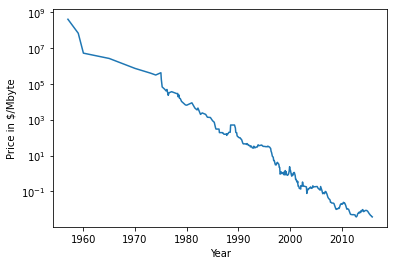

In [32]:
import pandas as pd
ram_prices = pd.read_csv("data/ram_price.csv")

plt.semilogy(ram_prices.date, ram_prices.price)
plt.xlabel("Year")
plt.ylabel("Price in $/Mbyte")

- En este ejemplo la variable respuesta es exponencial.
- Vamos a hacer una división de los datos por tiempo y vamos a comparar el rendimiento de nuestro arbol de decisión con el de un modelo lineal.

In [33]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
# use historical data to forecast prices after the year 2000
data_train = ram_prices[ram_prices.date < 2000]
data_test = ram_prices[ram_prices.date >= 2000]

# predict prices based on date
X_train = data_train.date[:, np.newaxis]
# we use a log-transform to get a simpler relationship of data to target
y_train = np.log(data_train.price)

tree = DecisionTreeRegressor(max_depth=3).fit(X_train, y_train)
linear_reg = LinearRegression().fit(X_train, y_train)

# predict on all data
X_all = ram_prices.date[:, np.newaxis]

pred_tree = tree.predict(X_all)
pred_lr = linear_reg.predict(X_all)

# undo log-transform
price_tree = np.exp(pred_tree)
price_lr = np.exp(pred_lr)

<ipython-input-33-277a051fe93d>:8: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  X_train = data_train.date[:, np.newaxis]
<ipython-input-33-277a051fe93d>:16: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  X_all = ram_prices.date[:, np.newaxis]


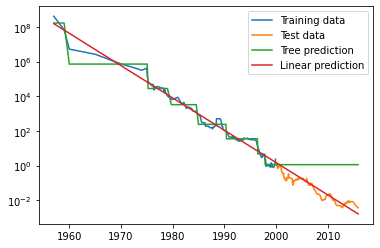

In [34]:
plt.semilogy(data_train.date, data_train.price, label="Training data")
plt.semilogy(data_test.date, data_test.price, label="Test data")
plt.semilogy(ram_prices.date, price_tree, label="Tree prediction")
plt.semilogy(ram_prices.date, price_lr, label="Linear prediction")
plt.legend()

### Importancia de variables

#### Importancia de variables en árboles de decisión
- Los modelos basados en árboles nos proporcinan además la importancia de las variables.
- Volvemos al conjunto de datos sobre cancer.

In [35]:
cancer = load_breast_cancer()
X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, cancer.target, stratify=cancer.target, random_state=42)
tree = DecisionTreeClassifier(max_depth=4, random_state=0)
tree.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=0)

In [36]:
print("Feature importances:")
print(tree.feature_importances_)

Feature importances:
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.01019737 0.04839825
 0.         0.         0.0024156  0.         0.         0.
 0.         0.         0.72682851 0.0458159  0.         0.
 0.0141577  0.         0.018188   0.1221132  0.01188548 0.        ]


- Como podemos ver, es coherente con lo visto en el árbol.

In [37]:
def plot_feature_importances_cancer(model):
    n_features = cancer.data.shape[1]
    plt.barh(np.arange(n_features), model.feature_importances_, align='center')
    plt.yticks(np.arange(n_features), cancer.feature_names)
    plt.xlabel("Feature importance")
    plt.ylabel("Feature")
    plt.ylim(-1, n_features)

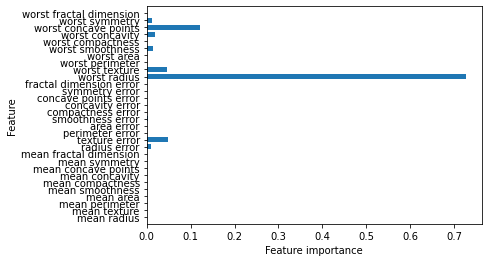

In [38]:
plot_feature_importances_cancer(tree)

- Que una característica no haya sido puntuada no implica que no sea importante. Simplemente el árbol no la ha usado
- Nótese que alcontrario que en otro tipo de modelos, no nos indican la importancia de una variable con respecto a un valor de la respuesta.

Feature importances: [0. 1.]


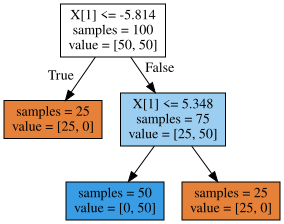

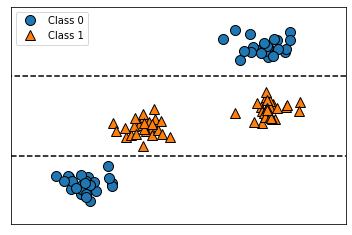

In [39]:
tree = mglearn.plots.plot_tree_not_monotone()
display(tree)

## Métodos de ensamblado de árboles

### RandomForestClassifier

- Veamos el algoritmo RandomForestClassifier

In [40]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=100, noise=0.25, random_state=3)
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,
                                                    random_state=42)

forest = RandomForestClassifier(n_estimators=5, random_state=2)
forest.fit(X_train, y_train)

RandomForestClassifier(n_estimators=5, random_state=2)

- Es interesante ver cómo son cada uno de los árboles generados y compararlo con el emsamblado final, es decir, con la agregación de estos árboles.

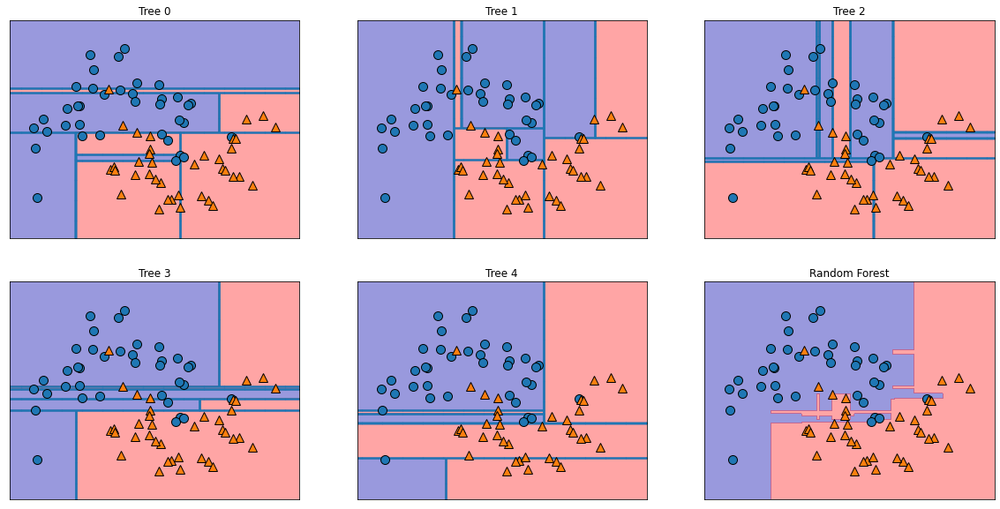

In [41]:
fig, axes = plt.subplots(2, 3, figsize=(20, 10))
for i, (ax, tree) in enumerate(zip(axes.ravel(), forest.estimators_)):
    ax.set_title("Tree {}".format(i))
    mglearn.plots.plot_tree_partition(X_train, y_train, tree, ax=ax)
    
mglearn.plots.plot_2d_separator(forest, X_train, fill=True, ax=axes[-1, -1],
                                alpha=.4)
axes[-1, -1].set_title("Random Forest")
mglearn.discrete_scatter(X_train[:, 0], X_train[:, 1], y_train)

- Veamos ahora el rendimiento de Random Forest sobre el conjunto de datos de cancer de pulmón.

In [42]:
X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, cancer.target, random_state=0)
forest = RandomForestClassifier(n_estimators=100, random_state=0)
forest.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(forest.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(forest.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.972


- Random Forest también proporciona la importancia de cada una de las variables.

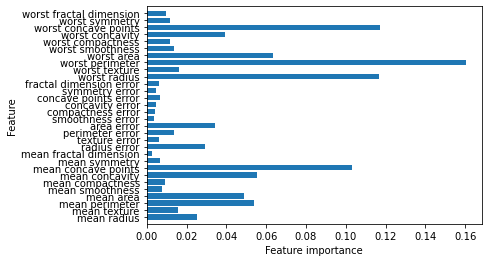

In [43]:
plot_feature_importances_cancer(forest)

- Vemos que no coincide perfectamente con las importancias obtenidas mediante el arbol de decisión. Esto se debe en parte a la aleatoriedad que se introduce en el proceso de construcción de los árboles.
- La más importante worst perimeter no fue usada por el árbol de decisión.

#### Gradient Boosted Regression Trees (Gradient Boosting Machines)


In [44]:
from sklearn.ensemble import GradientBoostingClassifier

GradientBoostingClassifier(random_state=0)

GradientBoostingClassifier(random_state=0)

- Veamos ahora el rendimiento del algoritmo de gradient boost de scikit-learn sobre el conjunto de datos de cancer de pulmón.

In [45]:
X_train, X_test, y_train, y_test = train_test_split(
    cancer.data, cancer.target, random_state=0)

gbrt = GradientBoostingClassifier(random_state=0)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 1.000
Accuracy on test set: 0.965


- ¿Y si reducimos la profundidad de los árboles?

In [46]:
gbrt = GradientBoostingClassifier(random_state=0, max_depth=1)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 0.991
Accuracy on test set: 0.972


- Ha mejorado usando árboles con un solo nodo y dos hojas

In [47]:
gbrt = GradientBoostingClassifier(random_state=0, learning_rate=0.01)
gbrt.fit(X_train, y_train)

print("Accuracy on training set: {:.3f}".format(gbrt.score(X_train, y_train)))
print("Accuracy on test set: {:.3f}".format(gbrt.score(X_test, y_test)))

Accuracy on training set: 0.988
Accuracy on test set: 0.965


- La tasa de aprendizaje es otro parámetro de gran importancia cuando usamos gradient boosting. Debe ser configurado junto con el número de árboles.

- Por último, como todos los métodos basados en árboles, también proporciona importancia de variables.

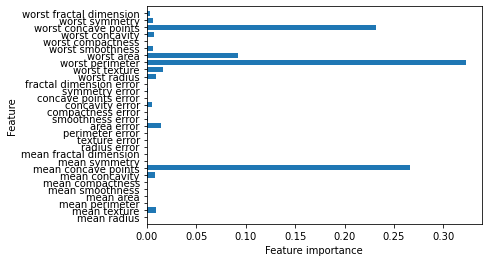

In [48]:
gbrt = GradientBoostingClassifier(random_state=0, max_depth=1)
gbrt.fit(X_train, y_train)

plot_feature_importances_cancer(gbrt)

### Gradient Boosting básico desde cero
- El código a continuación ha sido tomado del siguiente notebook: https://github.com/groverpr/Machine-Learning/blob/master/notebooks/01_Gradient_Boosting_Scratch.ipynb

#### Generación de datos

In [49]:
x = np.arange(0,50)
x = pd.DataFrame({'x':x})

In [50]:
# just random uniform distributions in differnt range

y1 = np.random.uniform(10,15,10)
y2 = np.random.uniform(20,25,10)
y3 = np.random.uniform(0,5,10)
y4 = np.random.uniform(30,32,10)
y5 = np.random.uniform(13,17,10)

y = np.concatenate((y1,y2,y3,y4,y5))
#y = y[:,None]


In [51]:
y

array([14.50817406, 13.39053816, 10.81748086, 13.35993486, 10.3522366 ,
       13.07391875, 10.11944388, 10.94973251, 11.19982226, 10.37977127,
       24.43399805, 20.20421295, 21.72333949, 22.22863941, 21.96785348,
       22.13573641, 21.60385774, 24.92798287, 20.78133178, 23.64539922,
        1.60714817,  3.62314587,  1.21145232,  3.90331519,  4.48037075,
        0.2754615 ,  0.07026681,  3.41403304,  3.52671471,  3.97339056,
       31.83621282, 30.61504863, 30.22604755, 30.19774862, 30.90483803,
       31.04654171, 31.26273505, 30.96417387, 30.95054389, 30.91255544,
       15.17264042, 15.80679052, 16.12034952, 15.83398464, 15.18885959,
       13.04212338, 13.72926883, 14.41156582, 14.12054699, 16.12842736])

#### Visualización del conjunto de datos

In [52]:
x.shape, y.shape

((50, 1), (50,))

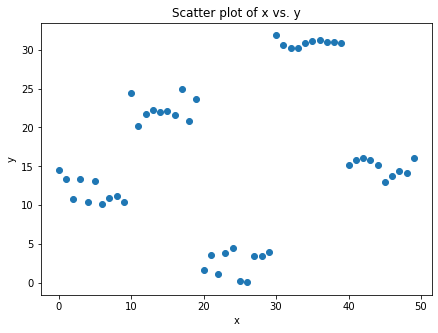

In [53]:
plt.figure(figsize=(7,5))
plt.plot(x.x, y, 'o')
plt.title("Scatter plot of x vs. y")
plt.xlabel("x")
plt.ylabel("y")
plt.show()

#### Implementación del algoritmo

Nótese que la siguiente implementación es una versión simplificada del algoritmo gradient boosting:
- Árboles de profundidad 1.
- Minimización del residuo.

In [54]:
def simple_gradient_boosting(xi, yi, lr=1, nestimators=30):
    ei = 0 # initialization of error
    n = len(yi)  # number of rows
    predf = 0 # initial prediction 0

    for i in range(nestimators): # loop will make 30 trees (n_estimators). 
        dt  = DecisionTreeRegressor(max_depth=1, min_samples_leaf=2)
        dt.fit(xi, yi)
        predi = dt.predict(xi)

        predf = predf + predi * lr  # final prediction will be previous prediction value + new prediction of residual
        ei = y - predf  # needed originl y here as residual always from original y    
        yi = ei # update yi as residual to reloop

        # plotting after prediction
        xa = np.array(x.x) 
        order = np.argsort(xa)
        xs = np.array(xa)[order]
        ys = np.array(predf)[order]

        f, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize = (13,2.5))

        ax1.plot(x,y, 'o')
        ax1.plot(xs, ys, 'r')
        ax1.set_title(f'Prediction (Iteration {i+1})')
        ax1.set_xlabel('x')
        ax1.set_ylabel('y / y_pred')

        ax2.plot(x, ei, 'go')
        ax2.set_title(f'Residuals vs. x (Iteration {i+1})')
        ax2.set_xlabel('x')
        ax2.set_ylabel('Residuals')

    

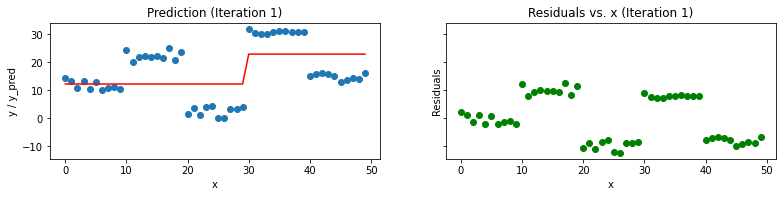

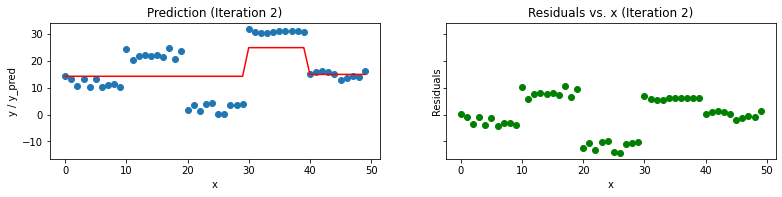

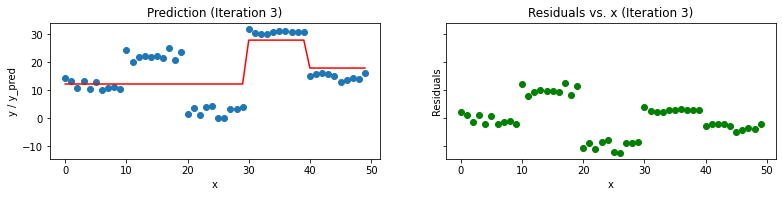

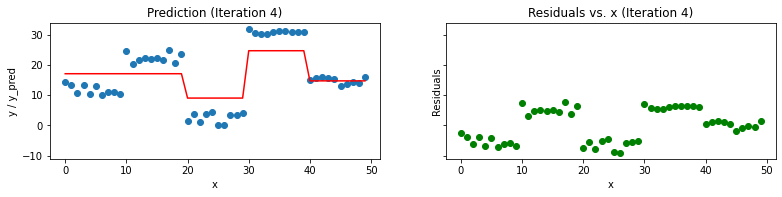

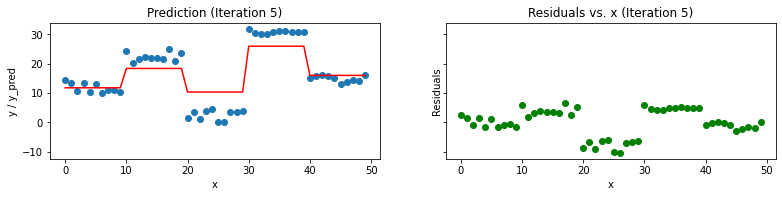

...

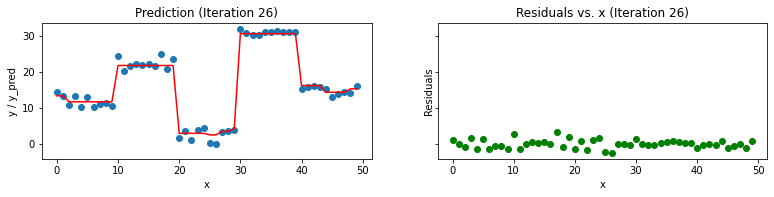

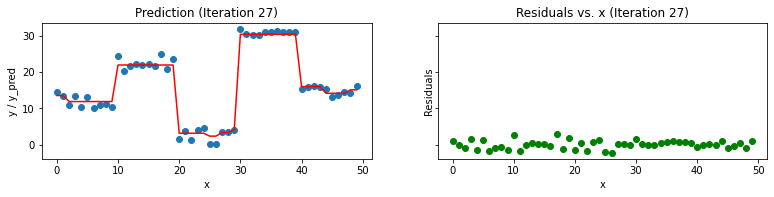

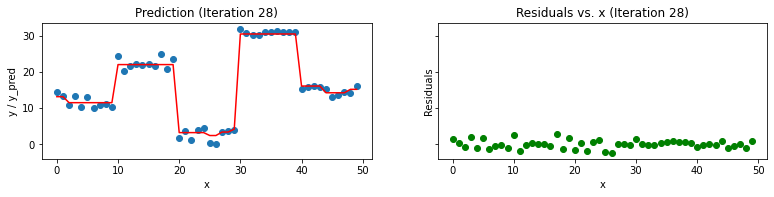

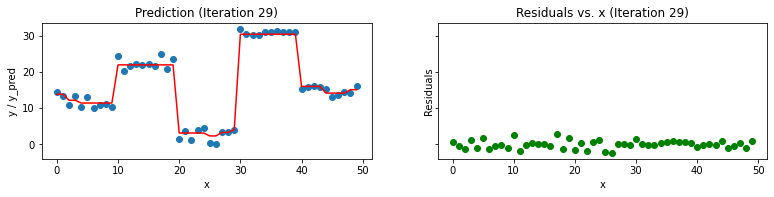

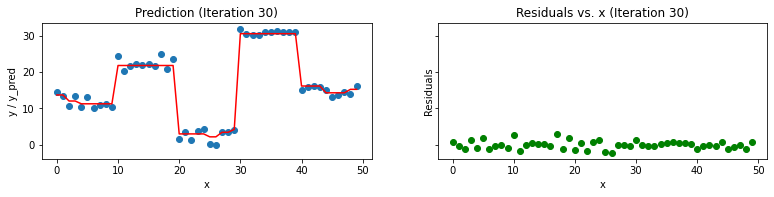

In [55]:
simple_gradient_boosting(x, y)

- Veamos que ocurre si reducimos la tasa de aprendizaje.

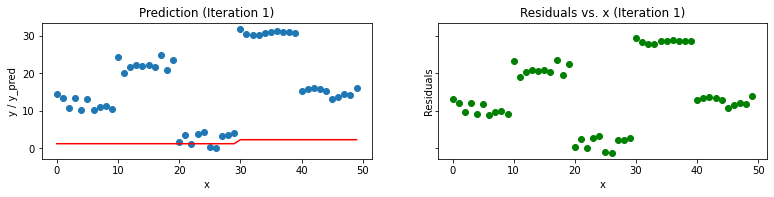

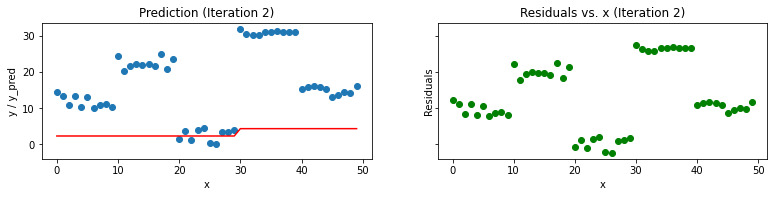

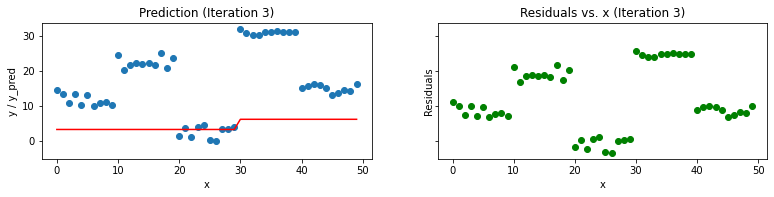

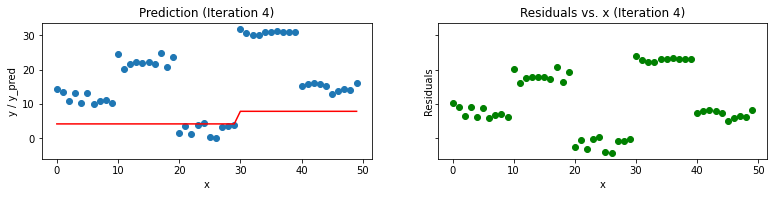

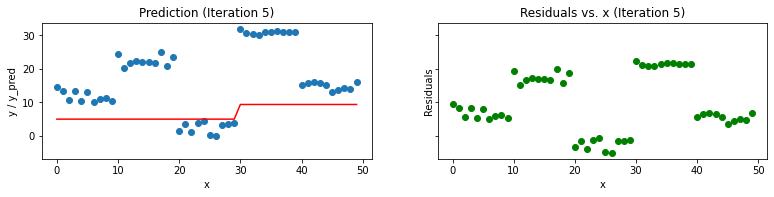

...

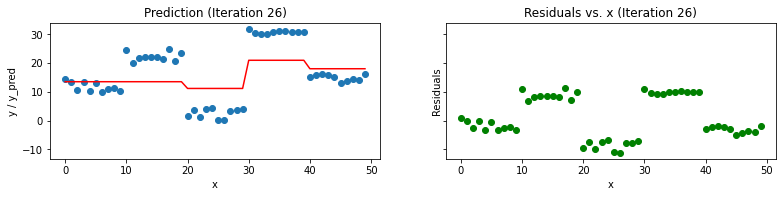

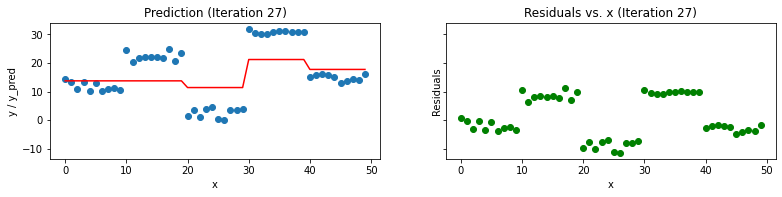

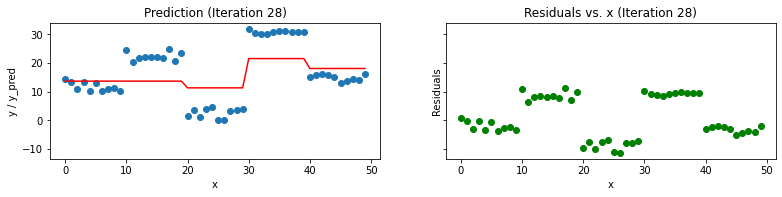

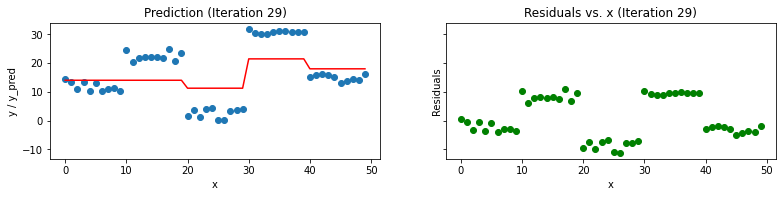

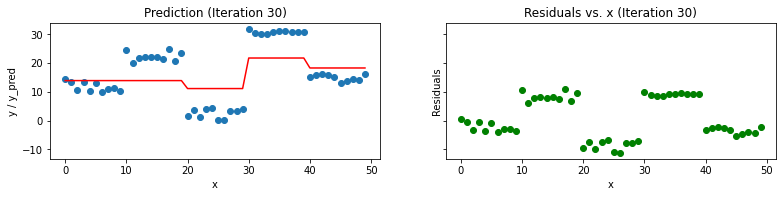

In [56]:
simple_gradient_boosting(x, y, 0.1)

- Ahora necesitamos aumentar el número de estimadores.

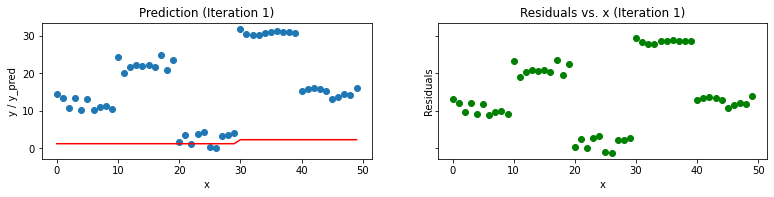

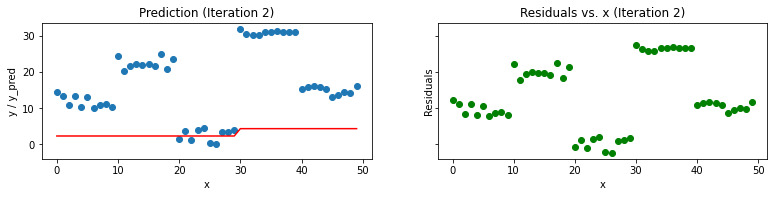

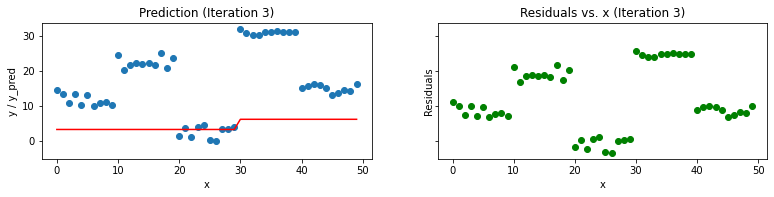

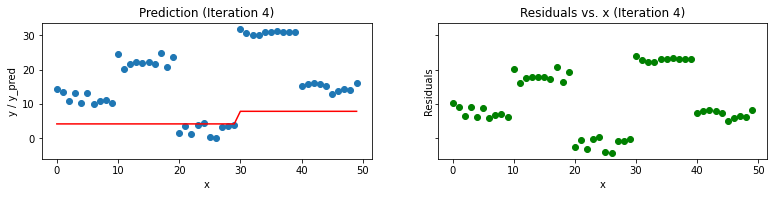

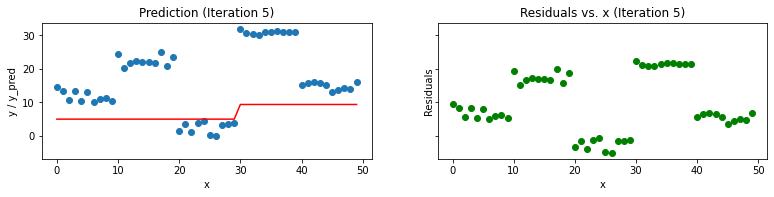

...

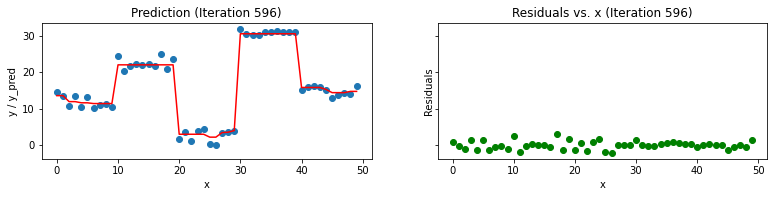

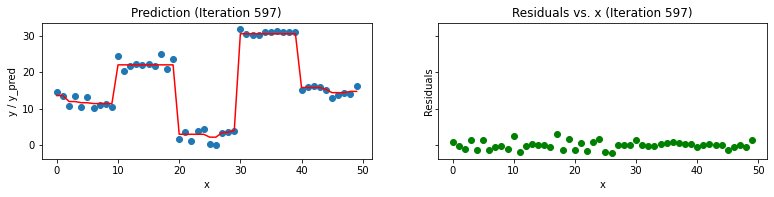

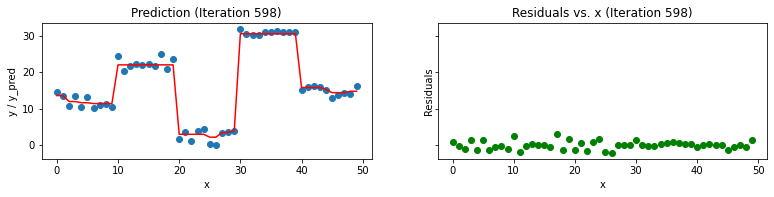

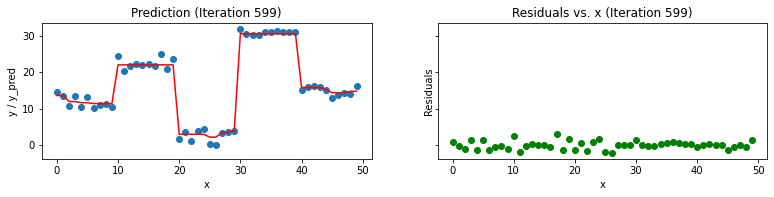

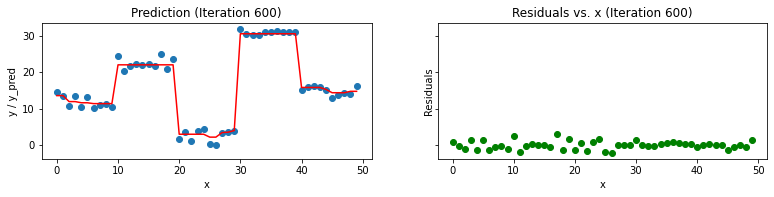

In [57]:
simple_gradient_boosting(x, y, 0.1, 600)

#### Observaciones
- Al contrario que con otros algoritmos, cada característica es tratada de forma indemendiente por lo que no necesitamos **estandarizar** o **normalizar** las escalas. De esto hablaremos en el siguiente tema.
- La interpretabilidad es un punto fuerte de los métodos basados en árboles. Aunque los ensamblados con muchos árboles son más complejos de interpretar.
- Si no limitamos la complejidad del arbol de decisión, seguramente acabemos **sobreajustando** el conjunto de entrenamiento. Si la limitamos mucho perdemos poder predictivo. 
- Los métodos de ensamblado de árboles resuelven las carencias de los árboles decisión sencillos.
- En la actualidad es más frecuente utilizar ensambles de árboles.
